<a href="https://colab.research.google.com/github/siddhi1991/GeoAI/blob/main/Building_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
%pip install geoai-py

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.6/56.6 kB 3.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 186.1/186.1 kB 11.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 494.8/494.8 kB 26.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.3/90.3 kB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 568.1/568.1 kB 34.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.1/17.1 MB 72.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 882.2/882.2 kB 43.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 60.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.8/41.8 kB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 62.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.2/62.2 kB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.

In [2]:
import geoai

In [3]:
geoai.__version__

'0.9.2'

In [4]:
import leafmap
from geoai.download import (
    download_naip,
    download_overture_buildings,
    extract_building_stats,
)

In [5]:
m = leafmap.Map(center=[38.4039, -96.1817], zoom=16)
m.add_basemap("Esri.WorldImagery")
m

Map(center=[38.4039, -96.1817], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom_in_title', 'z…

In [6]:
bbox = m.user_roi_bounds()
if bbox is None:
    bbox = (-117.6029, 47.65, -117.5936, 47.6563)

In [7]:
bbox


[-96.1917, 38.4099, -96.1692, 38.4205]

In [8]:
# Download NAIP imagery for the specified region
downloaded_files = download_naip(
    bbox=bbox,
    output_dir="naip_data",
    max_items=1,
    # year=2020,
)

print(f"Downloaded {len(downloaded_files)} files.")

Found 1 NAIP items.


m_3809639_sw_14_030_20230816_20240209.tif: 100%|██████████| 1.86G/1.86G [08:31<00:00, 3.91MiB/s]

Successfully saved to naip_data/m_3809639_sw_14_030_20230816_20240209.tif
Downloaded 1 files.


In [9]:
# Download buildings
data_file = download_overture_buildings(
    bbox=bbox,
    output="buildings.geojson",
)

In [10]:
stats = extract_building_stats(data_file)
print(stats)

{'total_buildings': 1266, 'has_height': 1170, 'has_name': 0, 'bbox': [-96.1918251, 38.4095973, -96.1692562, 38.4208237]}


In [11]:
m = leafmap.Map()
m.add_raster("/content/naip_data/m_3809639_sw_14_030_20230816_20240209.tif", layer_name="NAIP")
m.add_geojson("buildings.geojson", layer_name="Buildings")
m

Map(center=[38.406246499999995, -96.2187175], controls=(ZoomControl(options=['position', 'zoom_in_text', 'zoom…

In [12]:
raster_path = "/content/naip_data/m_3809639_sw_14_030_20230816_20240209.tif"

vector_url = "/content/buildings.geojson"

In [13]:
raster_path = "/content/naip_data/m_3809639_sw_14_030_20230816_20240209.tif"
vector_path = "/content/buildings.geojson"


In [14]:
geoai.get_raster_info(raster_path)["band_stats"]

[{'band': 1,
  'min': 1.0,
  'max': 255.0,
  'mean': 87.77317163431194,
  'std': 53.33104528237525},
 {'band': 2,
  'min': 10.0,
  'max': 255.0,
  'mean': 116.83973107857908,
  'std': 40.902769077501624},
 {'band': 3,
  'min': 1.0,
  'max': 255.0,
  'mean': 93.39165628443529,
  'std': 42.98004879913801},
 {'band': 4,
  'min': 3.0,
  'max': 255.0,
  'mean': 159.94492564469772,
  'std': 40.03225039129898}]

===== RASTER INFORMATION: /content/naip_data/m_3809639_sw_14_030_20230816_20240209.tif =====
Driver: GTiff
Dimensions: 20892 x 25672 pixels
Number of bands: 4
Data type: uint8
Coordinate Reference System: EPSG:26914
Georeferenced Bounds: BoundingBox(left=739722.6, bottom=4250703.600000001, right=745990.2, top=4258405.2)
Pixel Resolution: 0.3, 0.3
NoData Value: None

----- Band Statistics -----
Band 1:
  Min: 1.00
  Max: 255.00
  Mean: 87.77
  Std Dev: 53.33
Band 2:
  Min: 10.00
  Max: 255.00
  Mean: 116.84
  Std Dev: 40.90
Band 3:
  Min: 1.00
  Max: 255.00
  Mean: 93.39
  Std Dev: 42.98
Band 4:
  Min: 3.00
  Max: 255.00
  Mean: 159.94
  Std Dev: 40.03


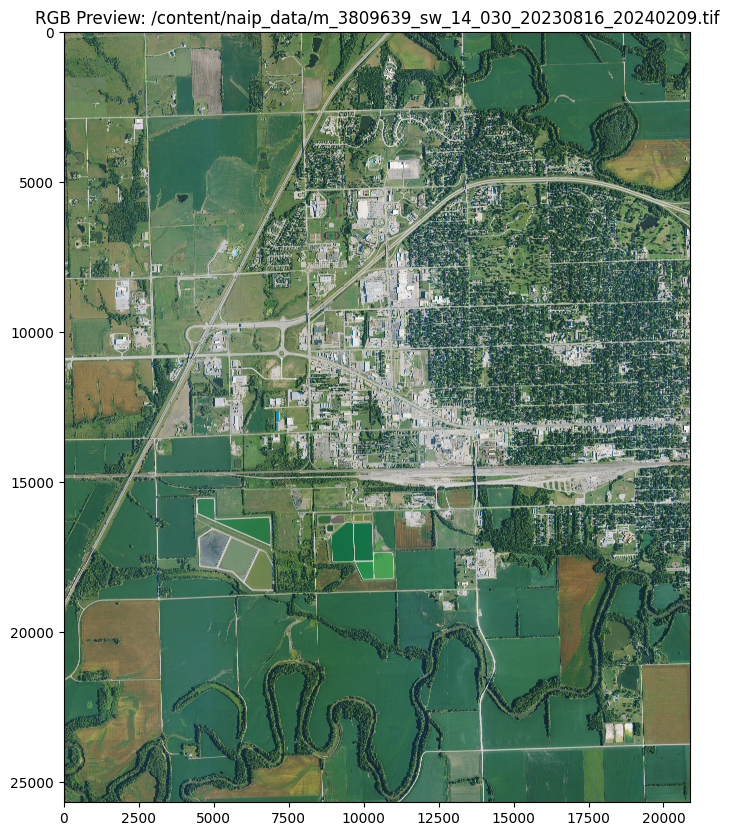

In [15]:
geoai.print_raster_info(raster_path, figsize=(18, 10))

===== VECTOR INFORMATION: /content/buildings.geojson =====
Driver: GEOJSON
Feature count: 1266
Geometry types: {'Polygon': 1266}
Coordinate Reference System: EPSG:4326
Bounds: [-96.1918251, 38.4095973, -96.1692562, 38.4208237]
Number of attributes: 23
Attribute names: id, bbox, version, sources, level, subtype, class, height, names, has_parts, is_underground, num_floors, num_floors_underground, min_height, min_floor, facade_color, facade_material, roof_material, roof_shape, roof_direction, roof_orientation, roof_color, roof_height

----- Attribute Statistics -----
Attribute: version
  min: 1
  max: 1
  mean: 1.0000
  std: 0.0000
  null_count: 0
Attribute: height
  min: 2.5228
  max: 15.3270
  mean: 5.2305
  std: 1.5913
  null_count: 96
Attribute: num_floors
  min: 2.0000
  max: 3.0000
  mean: 2.0833
  std: 0.2887
  null_count: 1254


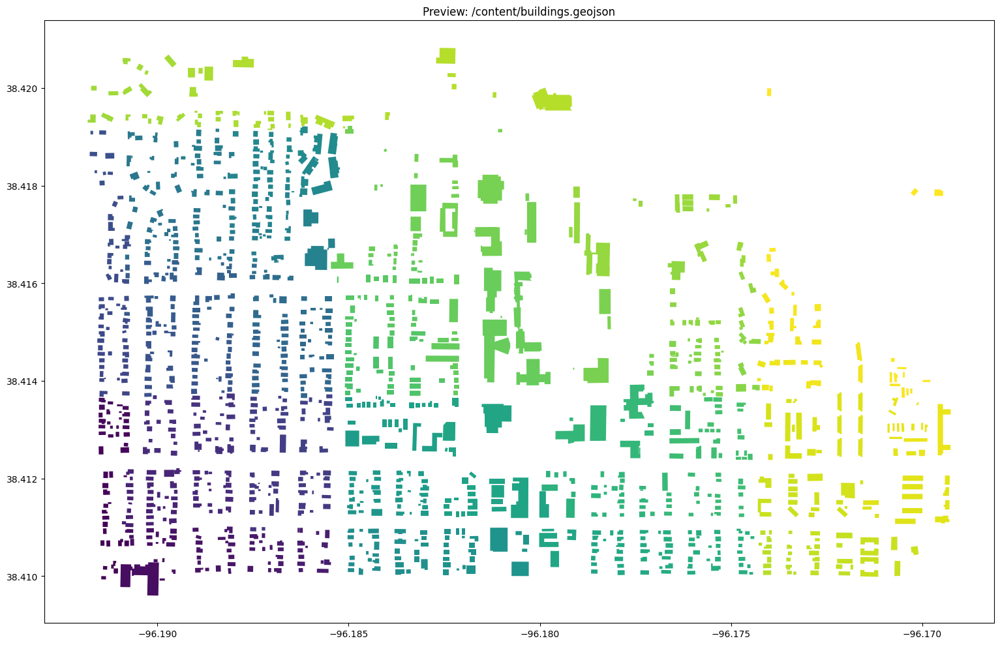

In [16]:
geoai.print_vector_info(vector_path, figsize=(18, 10))

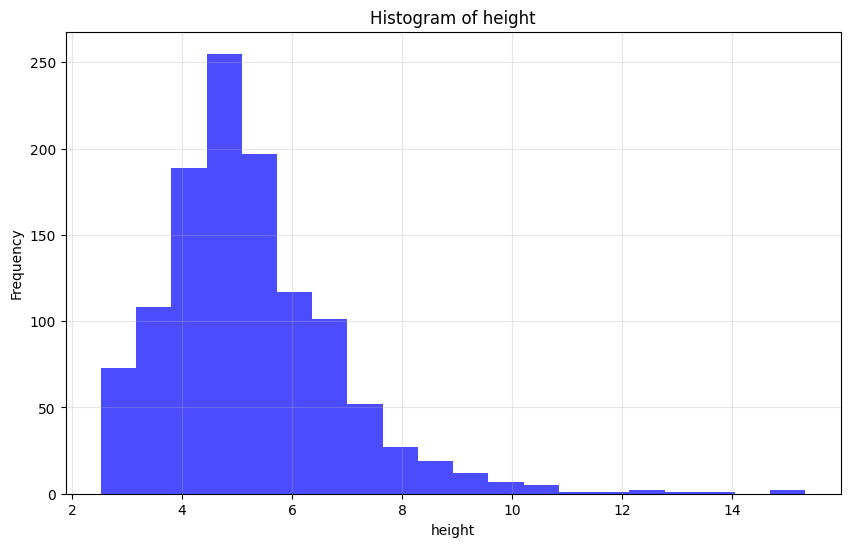

{'attribute': 'height',
 'type': 'numeric',
 'count': np.int64(1170),
 'null_count': np.int64(96),
 'min': 2.5227983,
 'max': 15.327047,
 'mean': np.float64(5.230509898119658),
 'median': 4.9903078,
 'std': 1.5912621750075586,
 'unique_values': 1170}

In [17]:
geoai.analyze_vector_attributes(vector_path, "height")

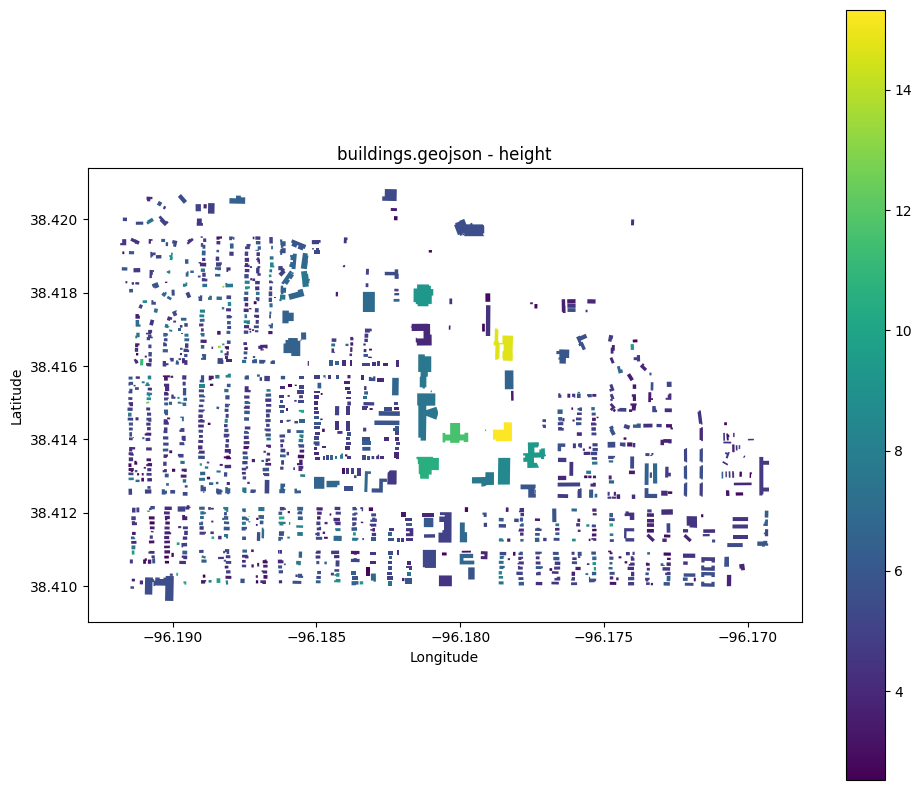

In [18]:
geoai.visualize_vector_by_attribute(vector_path, "height")

In [19]:
clip_raster_path = "naip_clip.tif"
geoai.clip_raster_by_bbox(
    raster_path,
    clip_raster_path,
    bbox=(0, 0, 500, 500),
    bands=[1, 2, 3],
    bbox_type="pixel",
)

'naip_clip.tif'

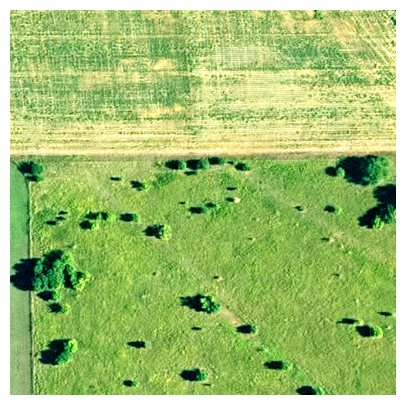

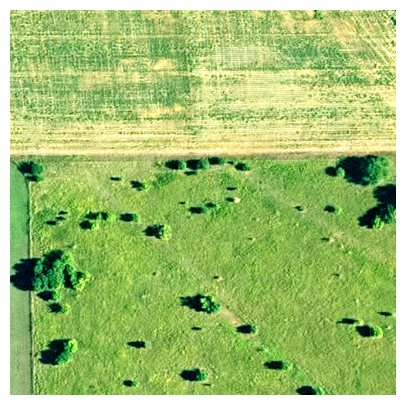

In [20]:
geoai.view_image(clip_raster_path)